In [ ]:
import urllib.request
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import io
from collections import defaultdict
import scipy
import powerlaw
from pathlib import Path
import urllib.request

# Load network

In [2]:
# Load the network
url = "https://raw.githubusercontent.com/denisababeii/socialgraphs_project/refs/heads/main/celebrities_clean_without_content.graphml"
    
try:
    with urllib.request.urlopen(url) as response:
        data = response.read()
        
    network = nx.read_graphml(io.BytesIO(data))
    print(f"✓ Network loaded successfully!")
    print(f"  Nodes: {network.number_of_nodes()}")
    print(f"  Edges: {network.number_of_edges()}")
        
except Exception as e:
    print(f"✗ Error loading network: {str(e)}")
    network = None

✓ Network loaded successfully!
  Nodes: 11286
  Edges: 125705


In [3]:
# Group nodes by occupations
occupation_groups = defaultdict(list)

for node in network.nodes():
    occupation = network.nodes[node].get('occupation', 'Unknown')
    occupation_groups[occupation].append(node)

# Network Analysis

## Basic Network Statistics

First, let's examine the basic properties of our network.

In [30]:
# Basic network statistics
print("="*80)
print("BASIC NETWORK STATISTICS")
print("="*80)
print(f"Number of nodes: {network.number_of_nodes()}")
print(f"Number of edges: {network.number_of_edges()}")
print(f"Network density: {nx.density(network):.6f}")
print(f"Is directed: {nx.is_directed(network)}")

BASIC NETWORK STATISTICS
Number of nodes: 11286
Number of edges: 125705
Network density: 0.000987
Is directed: True


## Degree Analysis

Analyzing the in-degree and out-degree distributions of the network.

In [31]:
# Calculate degrees
in_degrees = np.array(list(dict(network.in_degree()).values()))
out_degrees = np.array(list(dict(network.out_degree()).values()))
total_degrees = in_degrees + out_degrees

# Top nodes by degree
in_degree_dict = dict(network.in_degree())
out_degree_dict = dict(network.out_degree())

print("\n" + "="*80)
print("TOP 10 NODES BY IN-DEGREE")
print("="*80)
sorted_in = sorted(in_degree_dict.items(), key=lambda x: x[1], reverse=True)[:10]
for i, (node, degree) in enumerate(sorted_in, 1):
    name = network.nodes[node].get('Name', 'Unknown')
    print(f"{i:2d}. {name:<40} - In-degree: {degree}")

print("\n" + "="*80)
print("TOP 10 NODES BY OUT-DEGREE")
print("="*80)
sorted_out = sorted(out_degree_dict.items(), key=lambda x: x[1], reverse=True)[:10]
for i, (node, degree) in enumerate(sorted_out, 1):
    name = network.nodes[node].get('Name', 'Unknown')
    print(f"{i:2d}. {name:<40} - Out-degree: {degree}")


TOP 10 NODES BY IN-DEGREE
 1. Barack Obama                             - In-degree: 414
 2. Adolf Hitler                             - In-degree: 339
 3. William Shakespeare                      - In-degree: 314
 4. George Bush                              - In-degree: 286
 5. Joseph Stalin                            - In-degree: 232
 6. Ronald Reagan                            - In-degree: 209
 7. Bill Clinton                             - In-degree: 204
 8. Donald Trump                             - In-degree: 200
 9. Roger Ebert                              - In-degree: 194
10. John F. Kennedy                          - In-degree: 191

TOP 10 NODES BY OUT-DEGREE
 1. Meryl Streep                             - Out-degree: 105
 2. Martin Scorsese                          - Out-degree: 102
 3. David Beckham                            - Out-degree: 95
 4. Bob Dylan                                - Out-degree: 94
 5. Ennio Morricone                          - Out-degree: 92
 6. Friedrich

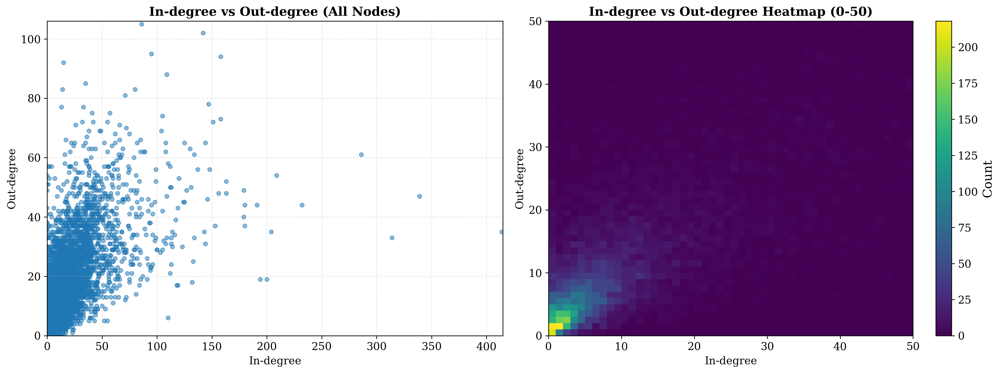

In [32]:
# Visualize In-degree vs Out-degree
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Scatter plot
axes[0].scatter(in_degrees, out_degrees, alpha=0.5, s=20)
axes[0].set_title("In-degree vs Out-degree (All Nodes)", fontsize=14, fontweight='bold')
axes[0].set_xlabel("In-degree", fontsize=12)
axes[0].set_ylabel("Out-degree", fontsize=12)
axes[0].grid(True, linestyle="--", alpha=0.3)
axes[0].set_xlim(0, max(in_degrees)+1)
axes[0].set_ylim(0, max(out_degrees)+1)

# Heatmap for nodes with degree <= 50
mask = (in_degrees <= 50) & (out_degrees <= 50)
x = in_degrees[mask]
y = out_degrees[mask]

heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[0,50],[0,50]])
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

im = axes[1].imshow(
    heatmap.T,
    extent=extent,
    origin='lower',
    cmap='viridis',
    interpolation='nearest',
    aspect='auto'
)

axes[1].set_title("In-degree vs Out-degree Heatmap (0-50)", fontsize=14, fontweight='bold')
axes[1].set_xlabel("In-degree", fontsize=12)
axes[1].set_ylabel("Out-degree", fontsize=12)
plt.colorbar(im, ax=axes[1], label='Count')

plt.tight_layout()
plt.show()

It is show that the relation between In and Out degree are somewhat linear.

## Degree Distribution

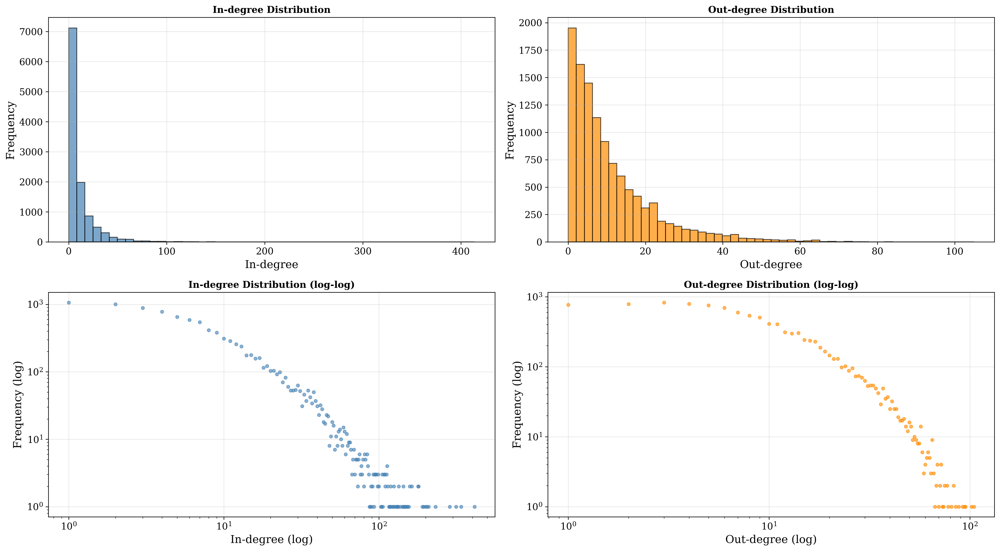

In [33]:
# Plot degree distributions
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# In-degree histogram
axes[0, 0].hist(in_degrees, bins=50, edgecolor='black', alpha=0.7, color='steelblue')
axes[0, 0].set_title("In-degree Distribution", fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel("In-degree")
axes[0, 0].set_ylabel("Frequency")
axes[0, 0].grid(True, alpha=0.3)

# Out-degree histogram
axes[0, 1].hist(out_degrees, bins=50, edgecolor='black', alpha=0.7, color='darkorange')
axes[0, 1].set_title("Out-degree Distribution", fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel("Out-degree")
axes[0, 1].set_ylabel("Frequency")
axes[0, 1].grid(True, alpha=0.3)

# Log-log plots for power-law analysis
# In-degree
in_deg_counts = np.bincount(in_degrees)
in_deg_values = np.arange(len(in_deg_counts))
mask_in = (in_deg_counts > 0) & (in_deg_values > 0)
axes[1, 0].loglog(in_deg_values[mask_in], in_deg_counts[mask_in], 'o', markersize=4, alpha=0.6, color='steelblue')
axes[1, 0].set_title("In-degree Distribution (log-log)", fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel("In-degree (log)")
axes[1, 0].set_ylabel("Frequency (log)")
axes[1, 0].grid(True, alpha=0.3)

# Out-degree
out_deg_counts = np.bincount(out_degrees)
out_deg_values = np.arange(len(out_deg_counts))
mask_out = (out_deg_counts > 0) & (out_deg_values > 0)
axes[1, 1].loglog(out_deg_values[mask_out], out_deg_counts[mask_out], 'o', markersize=4, alpha=0.6, color='darkorange')
axes[1, 1].set_title("Out-degree Distribution (log-log)", fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel("Out-degree (log)")
axes[1, 1].set_ylabel("Frequency (log)")
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

From the linear scale, it is shown that both degree distribution have high low degree nodes and only a few high degree outliers. From the log log scale, we can see clearer the tail on the high degree node. This observation means that the network follows a power law but we'll further back it up with more analysis.

## Assortativity

In [34]:
# Calculate assortativity coefficient
assortativity = nx.degree_assortativity_coefficient(network)
print(f"Degree Assortativity Coefficient: {assortativity:.4f}")

Degree Assortativity Coefficient: 0.0631


This shows a quite high assortativity meaning that the high degree nodes tend to connect with other high degree nodes

## Centrality Analysis

In [35]:
# Load centrality data from cache
import pickle

with open('centrality_cache.pkl', 'rb') as f:
    centrality_data = pickle.load(f)

print("Loaded centrality measures from cache:")
print(f"Available measures: {list(centrality_data.keys())}")
print()

# Extract centrality measures
betweenness = centrality_data.get('betweenness', {})
eigenvector = centrality_data.get('eigenvector', {})

# Display top 5 nodes for each centrality measure

print("\n" + "="*80)
print("Top 5 Nodes by Betweenness Centrality:")
print("="*80)
for node, score in sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:5]:
    print(f"{network.nodes[node]['Name']}: {score:.6f}")

print("\n" + "="*80)
print("Top 5 Nodes by Eigenvector Centrality:")
print("="*80)
for node, score in sorted(eigenvector.items(), key=lambda x: x[1], reverse=True)[:5]:
    print(f"{network.nodes[node]['Name']}: {score:.6f}")

Loaded centrality measures from cache:
Available measures: ['degree', 'betweenness', 'closeness', 'eigenvector', 'pagerank']


Top 5 Nodes by Betweenness Centrality:
Barack Obama: 0.042260
Adolf Hitler: 0.040600
William Shakespeare: 0.025570
George Bush: 0.023800
Pope John Paul II: 0.020291

Top 5 Nodes by Eigenvector Centrality:
Barack Obama: 0.159321
George Bush: 0.109099
Roger Ebert: 0.106388
Ronald Reagan: 0.101917
Martin Scorsese: 0.095358


This shows a quite high assortativity meaning that the high degree nodes tend to connect with other high degree nodes

## Power-Law Analysis of Degree Distributions

In [38]:
# Calculate power-law exponents for in-degree, out-degree, and total degree
in_degree_fit = powerlaw.Fit(in_degrees[in_degrees > 0], xmin=1)
out_degree_fit = powerlaw.Fit(out_degrees[out_degrees > 0], xmin=1)
total_degree_fit = powerlaw.Fit(total_degrees[total_degrees > 0], xmin=1)

print(f"\nIn-Degree Power-Law Exponent (alpha): {in_degree_fit.alpha:.3f}")
print(f"Out-Degree Power-Law Exponent (alpha): {out_degree_fit.alpha:.3f}")
print(f"Total Degree Power-Law Exponent (alpha): {total_degree_fit.alpha:.3f}")


In-Degree Power-Law Exponent (alpha): 1.527
Out-Degree Power-Law Exponent (alpha): 1.497
Total Degree Power-Law Exponent (alpha): 1.384


Power law exponent of $<2$ means that the network is an ultra small network.

## Correlation: Page Length vs Degree

In [41]:
# Add length_of_content attribute for each node
for node in network.nodes():
    nameURL = network.nodes[node].get('NameURL', '')
    file_path = Path(f"wikipages/{nameURL}.txt")
    
    if file_path.exists():
        try:
            with open(file_path, 'r', encoding='utf-8') as f:
                content = f.read()
                network.nodes[node]['length_of_content'] = len(content)
        except:
            network.nodes[node]['length_of_content'] = 0
    else:
        network.nodes[node]['length_of_content'] = 0

print("✓ Added length_of_content attribute to all nodes")

✓ Added length_of_content attribute to all nodes


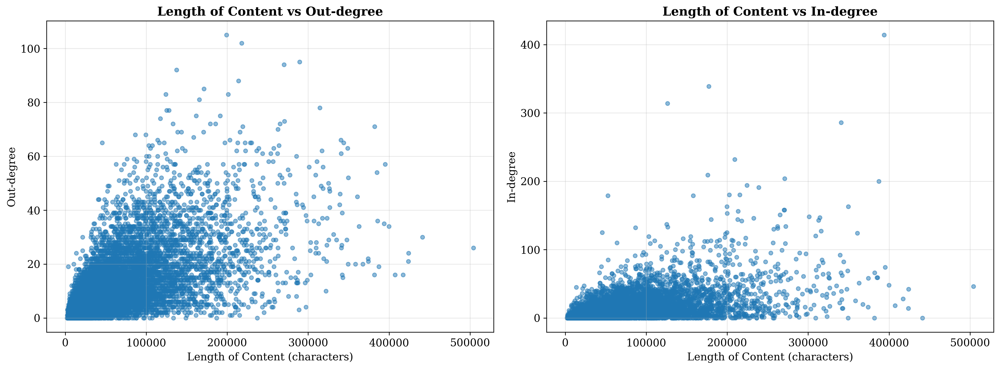

In [42]:
# Extract lengths for all nodes
lengths = np.array([network.nodes[node].get('length_of_content', 0) for node in network.nodes()])

# Filter out nodes with zero length
valid_mask = lengths > 0
lengths_filtered = lengths[valid_mask]
in_degrees_filtered = in_degrees[valid_mask]
out_degrees_filtered = out_degrees[valid_mask]

# Plot Length vs Out-degree and Length vs In-degree
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Length vs Out-degree
axes[0].scatter(lengths_filtered, out_degrees_filtered, alpha=0.5, s=20)
axes[0].set_xlabel("Length of Content (characters)", fontsize=12)
axes[0].set_ylabel("Out-degree", fontsize=12)
axes[0].set_title("Length of Content vs Out-degree", fontsize=14, fontweight='bold')
axes[0].grid(True, alpha=0.3)

# Length vs In-degree
axes[1].scatter(lengths_filtered, in_degrees_filtered, alpha=0.5, s=20)
axes[1].set_xlabel("Length of Content (characters)", fontsize=12)
axes[1].set_ylabel("In-degree", fontsize=12)
axes[1].set_title("Length of Content vs In-degree", fontsize=14, fontweight='bold')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

As expected, the lengthier the page content is the out degree the node will have. The same can not be said for in degree as there is no correclation between a celebrity's page length to popularity.

# Define eras

In [4]:
# Define historical eras based on your project notes
ERAS = [
    ("Before Christ", -float('inf'), 30),
    ("Classical Era", 30, 476),
    ("Middle Ages", 476, 1450),
    ("Early Modern", 1450, 1760),
    ("Industrial Era", 1760, 1840),
    ("Wartime Era", 1840, 1945),
    ("Post-War Era", 1945, 2025),
]

def get_person_eras(birth_year, death_year):
    """
    Returns the era a person belongs to based on their birth year.
    A person is assigned to the era they were born in.
    """
    # Handle missing or invalid data
    try:
        birth_year = float(birth_year)
    except (ValueError, TypeError):
        return []
    
    # Find which era the birth year falls into
    for era_name, era_start, era_end in ERAS:
        if era_start <= birth_year < era_end:
            return [era_name]
    
    return []

# Add era information directly to network nodes
print("Adding era information to network nodes...")
for node in network.nodes():
    birth_year = network.nodes[node].get('birthyear')
    death_year = network.nodes[node].get('deathyear')
    eras = get_person_eras(birth_year, death_year)
    network.nodes[node]['eras'] = eras

Adding era information to network nodes...


# Occupation Analysis by Era

In [43]:
# Analyze top occupations by era from network
era_occupation_data = []

for era_name, era_start, era_end in ERAS:
    # Get people in this era from network
    occupation_counts = defaultdict(int)
    people_count = 0
    
    for node in network.nodes():
        eras = network.nodes[node].get('eras', [])
        if era_name in eras:
            people_count += 1
            occupation = network.nodes[node].get('occupation', 'Unknown')
            occupation_counts[occupation] += 1
    
    if people_count == 0:
        continue
    
    # Sort occupations by count
    sorted_occupations = sorted(occupation_counts.items(), key=lambda x: x[1], reverse=True)
    
    era_occupation_data.append({
        'era': era_name,
        'total_people': people_count,
        'top_occupation': sorted_occupations[0][0] if sorted_occupations else 'N/A',
        'top_occupation_count': sorted_occupations[0][1] if sorted_occupations else 0,
        'top_occupation_pct': (sorted_occupations[0][1] / people_count * 100) if sorted_occupations else 0
    })

print("Number of occupations in total:", len(occupation_counts))
# Display results
print("Top Occupations by Historical Era\n")
print(f"{'Era':<35} {'People':>7} {'Top Occupation':<20} {'Count':>6} {'%':>6}")
print("="*85)

for data in era_occupation_data:
    print(f"{data['era']:<35} {data['total_people']:>7} {data['top_occupation']:<20} "
          f"{data['top_occupation_count']:>6} {data['top_occupation_pct']:>5.1f}%")

Number of occupations in total: 77
Top Occupations by Historical Era

Era                                  People Top Occupation        Count      %
Before Christ                           533 POLITICIAN              257  48.2%
Classical Era                           307 POLITICIAN              133  43.3%
Middle Ages                             871 POLITICIAN              413  47.4%
Early Modern                            882 POLITICIAN              248  28.1%
Industrial Era                          732 POLITICIAN              162  22.1%
Wartime Era                            3979 POLITICIAN              890  22.4%
Post-War Era                           3982 SOCCER PLAYER          1005  25.2%


## Most Connected Occupations by Era

In [6]:
# Calculate average degree (connections) by occupation for each era
def analyze_occupation_connections_by_era(era_name):
    """
    Analyze which occupations have the most connections in a given era.
    Returns average degree by occupation.
    """
    # Calculate degree for nodes in this era directly from network
    occupation_degrees = defaultdict(list)
    
    for node in network.nodes():
        eras = network.nodes[node].get('eras', [])
        if era_name in eras:
            degree = network.degree(node)
            occupation = network.nodes[node].get('occupation', 'Unknown')
            occupation_degrees[occupation].append(degree)
    
    # Calculate average degree per occupation
    avg_degrees = {}
    for occupation, degrees in occupation_degrees.items():
        avg_degrees[occupation] = {
            'avg_degree': np.mean(degrees),
            'total_people': len(degrees),
            'total_connections': sum(degrees)
        }
    
    return avg_degrees

# Analyze for all eras
print("Average Connections by Occupation in Different Eras\n")

for era_name in [era[0] for era in ERAS]:
    print(f"\n{'='*70}")
    print(f"{era_name}")
    print(f"{'='*70}")
    
    avg_degrees = analyze_occupation_connections_by_era(era_name)
    
    # Sort by average degree
    sorted_occupations = sorted(avg_degrees.items(), 
                                key=lambda x: x[1]['avg_degree'], 
                                reverse=True)[:10]
    
    print(f"{'Occupation':<25} {'Avg Degree':>12} {'People':>8} {'Total Conn':>12}")
    print("-"*70)
    
    for occupation, stats in sorted_occupations:
        print(f"{occupation:<25} {stats['avg_degree']:>12.1f} "
              f"{stats['total_people']:>8} {stats['total_connections']:>12}")

Average Connections by Occupation in Different Eras


Before Christ
Occupation                  Avg Degree   People   Total Conn
----------------------------------------------------------------------
HISTORIAN                         48.1       10          481
PHILOSOPHER                       31.2       55         1717
GEOGRAPHER                        29.0        3           87
WRITER                            28.8       47         1353
ASTRONOMER                        27.0        2           54
MILITARY PERSONNEL                26.5       24          635
MATHEMATICIAN                     24.0        7          168
NOBLEMAN                          23.0        1           23
PRESENTER                         22.0        1           22
DIPLOMAT                          22.0        2           44

Classical Era
Occupation                  Avg Degree   People   Total Conn
----------------------------------------------------------------------
ASTRONOMER                        52.0     

## Top 5 Occupations Over Time

Global Top 5 Occupations:
1. POLITICIAN (2517 people)
2. ACTOR (1190 people)
3. SOCCER PLAYER (1051 people)
4. WRITER (951 people)
5. RELIGIOUS FIGURE (511 people)


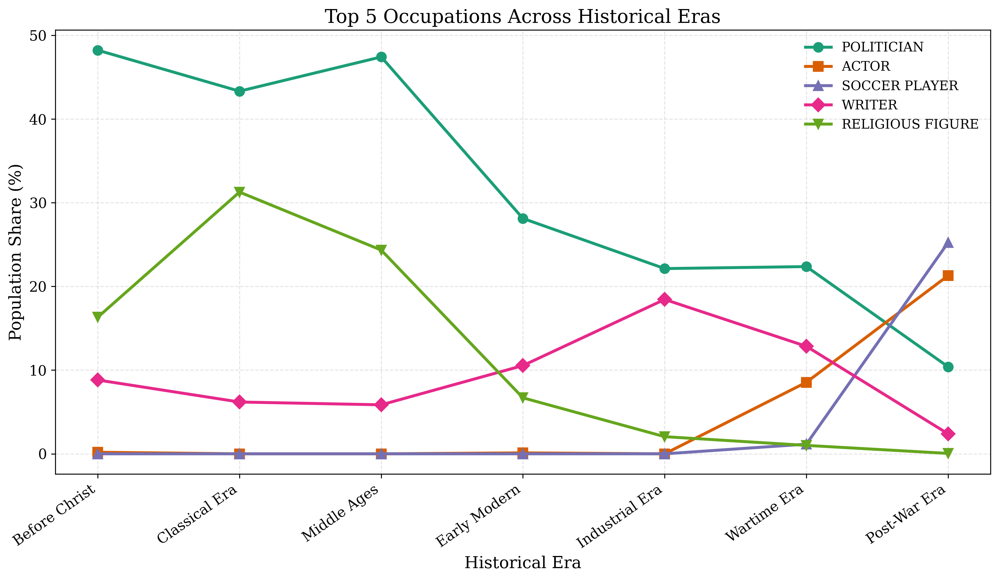


✓ Professionally styled line graph created.
✓ Saved as occupation_trends_top5.png (300 DPI)


In [7]:
# ============================================================
#   Publication-quality plot: Top 5 Occupations Across Eras
# ============================================================

from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib as mpl

# -----------------------
# 1. Compute top 5 occupations
# -----------------------
total_occupation_counts = defaultdict(int)

for node in network.nodes():
    occupation = network.nodes[node].get('occupation', 'Unknown')
    total_occupation_counts[occupation] += 1

top_5_occupations = [
    occ for occ, count in sorted(
        total_occupation_counts.items(),
        key=lambda x: x[1], reverse=True
    )[:5]
]

print("Global Top 5 Occupations:")
for i, occ in enumerate(top_5_occupations, 1):
    print(f"{i}. {occ} ({total_occupation_counts[occ]} people)")


# -----------------------
# 2. Collect data per era
# -----------------------
era_names = [era[0] for era in ERAS]
occupation_by_era = {occ: [] for occ in top_5_occupations}

for era_name in era_names:
    era_total = 0
    era_occ_counts = defaultdict(int)

    for node in network.nodes():
        eras = network.nodes[node].get('eras', [])
        if era_name in eras:
            era_total += 1
            occupation = network.nodes[node].get('occupation', 'Unknown')
            era_occ_counts[occupation] += 1

    for occ in top_5_occupations:
        pct = (era_occ_counts[occ] / era_total * 100) if era_total > 0 else 0
        occupation_by_era[occ].append(pct)


# -----------------------
# 3. Styling for scientific publications
# -----------------------
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.size'] = 12
mpl.rcParams['axes.labelsize'] = 14
mpl.rcParams['axes.titlesize'] = 16
mpl.rcParams['legend.fontsize'] = 11
mpl.rcParams['figure.dpi'] = 300

# Colorblind-safe scientific palette
colors = ['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e']
markers = ['o', 's', '^', 'D', 'v']

plt.figure(figsize=(12, 7))

# -----------------------
# 4. Plot lines
# -----------------------
for i, occ in enumerate(top_5_occupations):
    plt.plot(
        era_names,
        occupation_by_era[occ],
        label=occ,
        color=colors[i],
        marker=markers[i],
        linewidth=2.5,
        markersize=8
    )

# -----------------------
# 5. Axis formatting
# -----------------------
plt.xlabel("Historical Era")
plt.ylabel("Population Share (%)")
plt.title("Top 5 Occupations Across Historical Eras")

plt.xticks(rotation=35, ha='right')

plt.grid(True, linestyle='--', alpha=0.35)

# Simple and clean legend
plt.legend(frameon=False)

plt.tight_layout()

# Save figure
plt.savefig("occupation_trends_top5.png", dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Professionally styled line graph created.")
print("✓ Saved as occupation_trends_top5.png (300 DPI)")


## Rise and Fall of Occupations

C:\Users\MATRIXCOMPUTER\AppData\Local\Temp\ipykernel_14820\1742948366.py:72: UserWarning: Glyph 128316 (\N{UP-POINTING SMALL RED TRIANGLE}) missing from font(s) DejaVu Serif.
  plt.tight_layout()
C:\Users\MATRIXCOMPUTER\AppData\Local\Temp\ipykernel_14820\1742948366.py:72: UserWarning: Glyph 128317 (\N{DOWN-POINTING SMALL RED TRIANGLE}) missing from font(s) DejaVu Serif.
  plt.tight_layout()
d:\Program Files\SEM1\socialgraphs_project\.venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128316 (\N{UP-POINTING SMALL RED TRIANGLE}) missing from font(s) DejaVu Serif.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program Files\SEM1\socialgraphs_project\.venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128317 (\N{DOWN-POINTING SMALL RED TRIANGLE}) missing from font(s) DejaVu Serif.
  fig.canvas.print_figure(bytes_io, **kw)
d:\Program Files\SEM1\socialgraphs_project\.venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128316 (

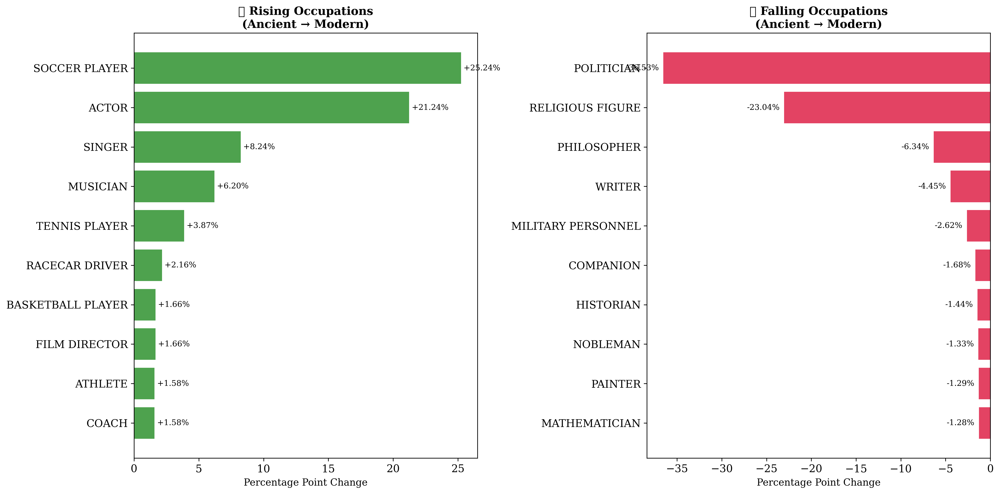


📈 TOP 10 RISING OCCUPATIONS (Ancient → Modern):
Occupation                   Early %   Modern %     Change
------------------------------------------------------------
SOCCER PLAYER                  0.00%     25.24%    +25.24%
ACTOR                          0.06%     21.30%    +21.24%
SINGER                         0.00%      8.24%     +8.24%
MUSICIAN                       0.18%      6.38%     +6.20%
TENNIS PLAYER                  0.00%      3.87%     +3.87%
RACECAR DRIVER                 0.00%      2.16%     +2.16%
BASKETBALL PLAYER              0.00%      1.66%     +1.66%
FILM DIRECTOR                  0.00%      1.66%     +1.66%
ATHLETE                        0.00%      1.58%     +1.58%
COACH                          0.00%      1.58%     +1.58%

📉 TOP 10 FALLING OCCUPATIONS (Ancient → Modern):
Occupation                   Early %   Modern %     Change
------------------------------------------------------------
POLITICIAN                    46.93%     10.40%    -36.53%
RELIGIOUS FI

In [8]:
# Compare occupation percentages between early and late eras
early_eras = ["Before Christ", "Classical Era", "Middle Ages"]
late_eras = ["Post-War Era"]

# Count occupations in early eras
early_occ_counts = defaultdict(int)
early_total = 0
for node in network.nodes():
    eras = network.nodes[node].get('eras', [])
    if any(e in eras for e in early_eras):
        early_total += 1
        occupation = network.nodes[node].get('occupation', 'Unknown')
        early_occ_counts[occupation] += 1

# Count occupations in late eras
late_occ_counts = defaultdict(int)
late_total = 0
for node in network.nodes():
    eras = network.nodes[node].get('eras', [])
    if any(e in eras for e in late_eras):
        late_total += 1
        occupation = network.nodes[node].get('occupation', 'Unknown')
        late_occ_counts[occupation] += 1

# Calculate percentage change
all_occupations = set(early_occ_counts.keys()) | set(late_occ_counts.keys())
occupation_changes = []

for occ in all_occupations:
    early_pct = (early_occ_counts[occ] / early_total * 100) if early_total > 0 else 0
    late_pct = (late_occ_counts[occ] / late_total * 100) if late_total > 0 else 0
    change = late_pct - early_pct
    
    occupation_changes.append({
        'occupation': occ,
        'early_pct': early_pct,
        'late_pct': late_pct,
        'change': change,
        'early_count': early_occ_counts[occ],
        'late_count': late_occ_counts[occ]
    })

# Sort by change
rising = sorted([o for o in occupation_changes if o['change'] > 0], 
                key=lambda x: x['change'], reverse=True)[:10]
falling = sorted([o for o in occupation_changes if o['change'] < 0], 
                 key=lambda x: x['change'])[:10]

# Create visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# Rising occupations
rising_names = [o['occupation'] for o in rising]
rising_changes = [o['change'] for o in rising]
bars1 = ax1.barh(rising_names, rising_changes, color='forestgreen', alpha=0.8)
ax1.set_xlabel('Percentage Point Change', fontsize=11)
ax1.set_title('🔼 Rising Occupations\n(Ancient → Modern)', fontsize=13, fontweight='bold')
ax1.invert_yaxis()
for i, (bar, val) in enumerate(zip(bars1, rising_changes)):
    ax1.text(val + 0.2, i, f'+{val:.2f}%', va='center', fontsize=9)

# Falling occupations
falling_names = [o['occupation'] for o in falling]
falling_changes = [o['change'] for o in falling]
bars2 = ax2.barh(falling_names, falling_changes, color='crimson', alpha=0.8)
ax2.set_xlabel('Percentage Point Change', fontsize=11)
ax2.set_title('🔽 Falling Occupations\n(Ancient → Modern)', fontsize=13, fontweight='bold')
ax2.invert_yaxis()
for i, (bar, val) in enumerate(zip(bars2, falling_changes)):
    ax2.text(val - 0.5, i, f'{val:.2f}%', va='center', fontsize=9, ha='right')

plt.tight_layout()
plt.show()

# Print details
print("\n📈 TOP 10 RISING OCCUPATIONS (Ancient → Modern):")
print(f"{'Occupation':<25} {'Early %':>10} {'Modern %':>10} {'Change':>10}")
print("-"*60)
for o in rising:
    change_str = f"+{o['change']:.2f}"
    print(f"{o['occupation']:<25} {o['early_pct']:>9.2f}% {o['late_pct']:>9.2f}% {change_str:>9}%")

print("\n📉 TOP 10 FALLING OCCUPATIONS (Ancient → Modern):")
print(f"{'Occupation':<25} {'Early %':>10} {'Modern %':>10} {'Change':>10}")
print("-"*60)
for o in falling:
    print(f"{o['occupation']:<25} {o['early_pct']:>9.2f}% {o['late_pct']:>9.2f}% {o['change']:>9.2f}%")

## TF-IDF Word Clouds by Occupation

In [9]:
# Additional imports for NLP analysis
import string
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from collections import Counter

# Download required NLTK data
try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')

try:
    nltk.data.find('corpora/wordnet')
except LookupError:
    nltk.download('wordnet')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

print("✓ NLP libraries loaded successfully!")

✓ NLP libraries loaded successfully!


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\MATRIXCOMPUTER\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [10]:
# Define text cleaning and tokenization function
def clean_and_tokenize(text):
    # Remove URLs and web-specific content
    text = re.sub(r'https?://\S+', '', text)
    text = re.sub(r'www\.\S+', '', text)
    text = re.sub(r'\S+\.(com|org|net|edu|gov|uk)\b', '', text, flags=re.IGNORECASE)
    
    # Remove Wikipedia/HTML markup
    text = re.sub(r'\{\{[^}]+\}\}', '', text)
    text = re.sub(r'\[\[[^\]]+\]\]', '', text)
    text = re.sub(r'<ref[^>]*>.*?</ref>', '', text, flags=re.DOTALL)
    text = re.sub(r'<[^>]+>', '', text)
    text = re.sub(r'\[\[(Category|File|Image):[^\]]+\]\]', '', text, flags=re.IGNORECASE)
    text = re.sub(r'\bstyle\s*=\s*["\'][^"\']*["\']', '', text)
    text = re.sub(r'\b(align|valign|colspan|rowspan|width|height)\b\s*=\s*\S+', '', text)
    
    # Set everything to lowercase
    text = text.lower()
    
    # Remove all punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    
    # Tokenize (split by whitespace)
    tokens = text.split()
    
    # Filter, remove stop words, and lemmatize
    cleaned_tokens = []
    for token in tokens:
        if token in stop_words:
            continue
        if not token.isalpha():
            continue
        if len(token) < 3:
            continue
        if len(token) > 20:
            continue
        lemmatized = lemmatizer.lemmatize(token)
        cleaned_tokens.append(lemmatized)
    
    return cleaned_tokens

print("✓ Text cleaning function defined!")

✓ Text cleaning function defined!


In [11]:
# Define TF-IDF computation function
def compute_tf_idf(documents_dict, min_df=2):
    """
    Compute TF-IDF scores for a dictionary of documents.
    documents_dict: {doc_id: text}
    """
    # Tokenize and compute term frequencies
    doc_term_freq = {}
    doc_total_terms = {}

    for doc_id, text in documents_dict.items():
        tokens = clean_and_tokenize(text)
        term_counts = Counter(tokens)
        doc_term_freq[doc_id] = term_counts
        doc_total_terms[doc_id] = len(tokens)
    
    # Compute document frequency for each term
    term_doc_freq = Counter()
    all_terms = set()
    
    for doc_id, term_counts in doc_term_freq.items():
        for term in term_counts.keys():
            term_doc_freq[term] += 1
            all_terms.add(term)

    # Filter by document frequency
    N = len(documents_dict)
    filtered_terms = {term for term, df in term_doc_freq.items() if df >= min_df}
    
    # Calculate IDF
    idf_scores = {}
    for term in filtered_terms:
        doc_freq = term_doc_freq[term]
        idf = np.log(N / doc_freq)
        idf_scores[term] = idf

    # Compute TF-IDF for each document
    tf_idf_matrix = {}
    for doc_id, term_counts in doc_term_freq.items():
        tf_idf_vector = {}
        total_terms = doc_total_terms[doc_id]
        
        if total_terms == 0:
            tf_idf_matrix[doc_id] = {}
            continue

        for term, count in term_counts.items():
            tf = count / total_terms
            if term in idf_scores:
                tf_idf = tf * idf_scores[term]
                if tf_idf > 0:
                    tf_idf_vector[term] = tf_idf

        tf_idf_matrix[doc_id] = tf_idf_vector
    return tf_idf_matrix

print("✓ TF-IDF computation function defined!")

✓ TF-IDF computation function defined!


In [44]:
# Load Wikipedia content for each person from local files
WIKIPAGES_DIR = "wikipages"

def load_person_content(name_url):
    """Load Wikipedia content from local file using NameURL."""
    filepath = os.path.join(WIKIPAGES_DIR, f"{name_url}.txt")
    try:
        with open(filepath, 'r', encoding='utf-8') as f:
            return f.read()
    except FileNotFoundError:
        return None
    except Exception as e:
        return None

In [45]:
# Get top 10 occupations overall for detailed analysis
top_10_occupations = [
    occ for occ, count in sorted(
        total_occupation_counts.items(),
        key=lambda x: x[1], reverse=True
    )[:10]
]

print("Global Top 10 Occupations for detailed analysis:")
for i, occ in enumerate(top_10_occupations, 1):
    print(f"{i}. {occ} ({total_occupation_counts[occ]} people)")

Global Top 10 Occupations for detailed analysis:
1. POLITICIAN (2517 people)
2. ACTOR (1190 people)
3. SOCCER PLAYER (1051 people)
4. WRITER (951 people)
5. RELIGIOUS FIGURE (511 people)
6. SINGER (435 people)
7. MUSICIAN (376 people)
8. PHILOSOPHER (281 people)
9. PHYSICIST (268 people)
10. COMPOSER (225 people)


## TF-IDF Word Clouds for Top 10 Occupations

In [46]:
# Build combined text documents for each of the top 10 occupations
print("Building occupation documents from Wikipedia pages...")

occupation_docs = {}
occupation_content_counts = {}

for occ in top_10_occupations:
    combined_text = []
    content_count = 0
    
    for node in network.nodes():
        if network.nodes[node].get('occupation') == occ:
            name_url = network.nodes[node].get('NameURL', '')
            content = load_person_content(name_url)
            if content:
                combined_text.append(content)
                content_count += 1
    
    occupation_docs[occ] = ' '.join(combined_text)
    occupation_content_counts[occ] = content_count
    print(f"  {occ}: {content_count} pages loaded")

print(f"\n✓ Loaded content for {len(occupation_docs)} occupations")

Building occupation documents from Wikipedia pages...
  POLITICIAN: 2513 pages loaded
  POLITICIAN: 2513 pages loaded
  ACTOR: 1189 pages loaded
  ACTOR: 1189 pages loaded
  SOCCER PLAYER: 1050 pages loaded
  SOCCER PLAYER: 1050 pages loaded
  WRITER: 949 pages loaded
  WRITER: 949 pages loaded
  RELIGIOUS FIGURE: 511 pages loaded
  RELIGIOUS FIGURE: 511 pages loaded
  SINGER: 435 pages loaded
  SINGER: 435 pages loaded
  MUSICIAN: 376 pages loaded
  MUSICIAN: 376 pages loaded
  PHILOSOPHER: 280 pages loaded
  PHYSICIST: 268 pages loaded
  PHILOSOPHER: 280 pages loaded
  PHYSICIST: 268 pages loaded
  COMPOSER: 225 pages loaded

✓ Loaded content for 10 occupations
  COMPOSER: 225 pages loaded

✓ Loaded content for 10 occupations


In [16]:
# Compute TF-IDF for top 10 occupations
print("Computing TF-IDF for occupations...")
occupation_tf_idf = compute_tf_idf(occupation_docs, min_df=1)
print("✓ TF-IDF computed!")

Computing TF-IDF for occupations...
✓ TF-IDF computed!
✓ TF-IDF computed!


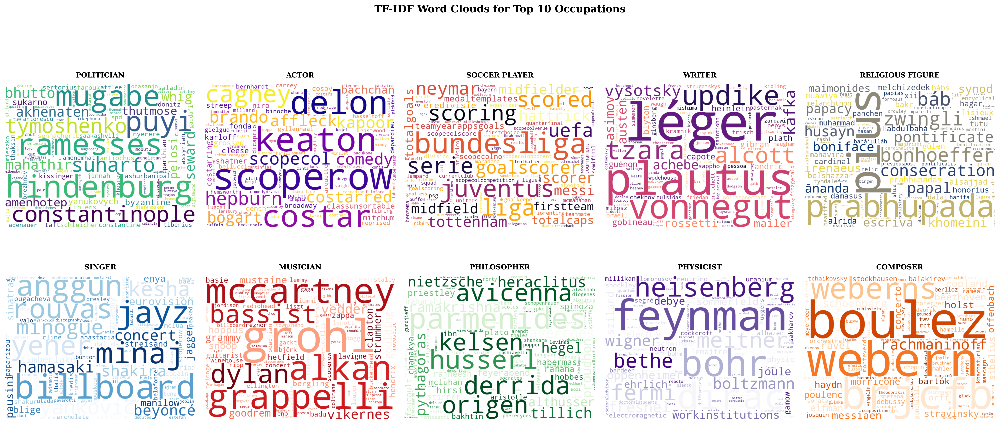


✓ Occupation word clouds complete!


In [17]:
# Create TF-IDF word clouds for top 10 occupations
def create_tfidf_wordclouds(tfidf_dict, labels, title, nrows=2, ncols=5):
    fig, axes = plt.subplots(nrows, ncols, figsize=(22, 10))
    axes = axes.flatten()
    
    colormaps = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 
                 'Blues', 'Reds', 'Greens', 'Purples', 'Oranges']
    
    for idx, label in enumerate(labels):
        ax = axes[idx]
        
        if label not in tfidf_dict or not tfidf_dict[label]:
            ax.text(0.5, 0.5, f'No data\nfor\n{label}',
                    ha='center', va='center', fontsize=14, color='gray')
            ax.set_title(label, fontsize=11, fontweight='bold', pad=10)
            ax.axis('off')
            continue
        
        # Generate word cloud
        wc = WordCloud(width=800, height=600,
                       background_color='white',
                       colormap=colormaps[idx % len(colormaps)],
                       max_words=100,
                       relative_scaling=0.5,
                       min_font_size=8).generate_from_frequencies(tfidf_dict[label])
        
        ax.imshow(wc, interpolation='bilinear')
        ax.set_title(label, fontsize=11, fontweight='bold', pad=10)
        ax.axis('off')
    
    # Hide unused subplots
    for idx in range(len(labels), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle(title, fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

# Create word clouds for top 10 occupations
create_tfidf_wordclouds(
    occupation_tf_idf,
    top_10_occupations,
    'TF-IDF Word Clouds for Top 10 Occupations'
)

print("\n✓ Occupation word clouds complete!")

## Sentiment Analysis by Occupation

In [ ]:
# Download LabMT sentiment word list
url = "https://journals.plos.org/plosone/article/file?id=10.1371/journal.pone.0026752.s001&type=supplementary"

try:
    # Download the file
    labmt_path = "wikipages/labmt_words.txt"
    urllib.request.urlretrieve(url, labmt_path)
    
    # Load it as a dataframe
    labmt = pd.read_csv(labmt_path, sep='\t', skiprows=2)
    print(f"✓ Loaded {len(labmt)} words from LabMT word list")
    
    # Create dictionary: word -> happiness score
    labmt_dict = dict(zip(labmt['word'].str.lower(), labmt['happiness_average']))
    
except Exception as e:
    print(f"✗ Error loading LabMT: {e}")

✓ Loaded 10222 words from LabMT word list


In [19]:
# Define sentiment calculation function
def calculate_sentiment(tokens, sentiment_dict=None):
    """Calculate average sentiment score for a list of tokens."""
    if sentiment_dict is None:
        sentiment_dict = labmt_dict
    
    # Filter tokens that exist in sentiment dictionary
    scored_tokens = [sentiment_dict[token] for token in tokens if token in sentiment_dict]
    
    # Return average, or None if no tokens matched
    if scored_tokens:
        return sum(scored_tokens) / len(scored_tokens)
    else:
        return None

print("✓ Sentiment calculation function defined!")

✓ Sentiment calculation function defined!


In [20]:
# Calculate sentiment for each person from their Wikipedia page
print("Calculating sentiment for each person...")

sentiments_calculated = 0
sentiments_failed = 0
all_sentiments = []

for node in network.nodes():
    # Get Wikipedia content
    name_url = network.nodes[node].get('NameURL', '')
    content = load_person_content(name_url)
    
    if not content:
        network.nodes[node]['sentiment'] = None
        sentiments_failed += 1
        continue
    
    # Clean and tokenize
    tokens = clean_and_tokenize(content)
    
    # Calculate sentiment
    sentiment = calculate_sentiment(tokens)
    
    # Store as node attribute
    network.nodes[node]['sentiment'] = sentiment
    
    if sentiment is not None:
        sentiments_calculated += 1
        all_sentiments.append(sentiment)
    else:
        sentiments_failed += 1

print(f"\n{'Sentiments calculated:':<30}{sentiments_calculated}")
print(f"{'Failed (no content/words):':<30}{sentiments_failed}")
print(f"{'Total nodes:':<30}{network.number_of_nodes()}")

Calculating sentiment for each person...

Sentiments calculated:        11270
Failed (no content/words):    16
Total nodes:                  11286

Sentiments calculated:        11270
Failed (no content/words):    16
Total nodes:                  11286


In [21]:
# Overall sentiment statistics
sentiment_mean = np.mean(all_sentiments)
sentiment_median = np.median(all_sentiments)
sentiment_variance = np.var(all_sentiments)
sentiment_std = np.std(all_sentiments)
sentiment_25th = np.percentile(all_sentiments, 25)
sentiment_75th = np.percentile(all_sentiments, 75)
sentiment_min = np.min(all_sentiments)
sentiment_max = np.max(all_sentiments)

print("Overall Sentiment Statistics:")
print(f"{'Mean:':<28}{sentiment_mean:.4f}")
print(f"{'Median:':<28}{sentiment_median:.4f}")
print(f"{'Variance:':<28}{sentiment_variance:.4f}")
print(f"{'Std Deviation:':<28}{sentiment_std:.4f}")
print(f"{'25th Percentile (Q1):':<28}{sentiment_25th:.4f}")
print(f"{'75th Percentile (Q3):':<28}{sentiment_75th:.4f}")
print(f"{'IQR (Q3-Q1):':<28}{sentiment_75th - sentiment_25th:.4f}")
print(f"{'Minimum:':<28}{sentiment_min:.4f}")
print(f"{'Maximum:':<28}{sentiment_max:.4f}")
print(f"{'Sample size:':<28}{len(all_sentiments)} people")

Overall Sentiment Statistics:
Mean:                       5.7094
Median:                     5.7241
Variance:                   0.0285
Std Deviation:              0.1689
25th Percentile (Q1):       5.5942
75th Percentile (Q3):       5.8294
IQR (Q3-Q1):                0.2352
Minimum:                    4.9945
Maximum:                    6.4147
Sample size:                11270 people


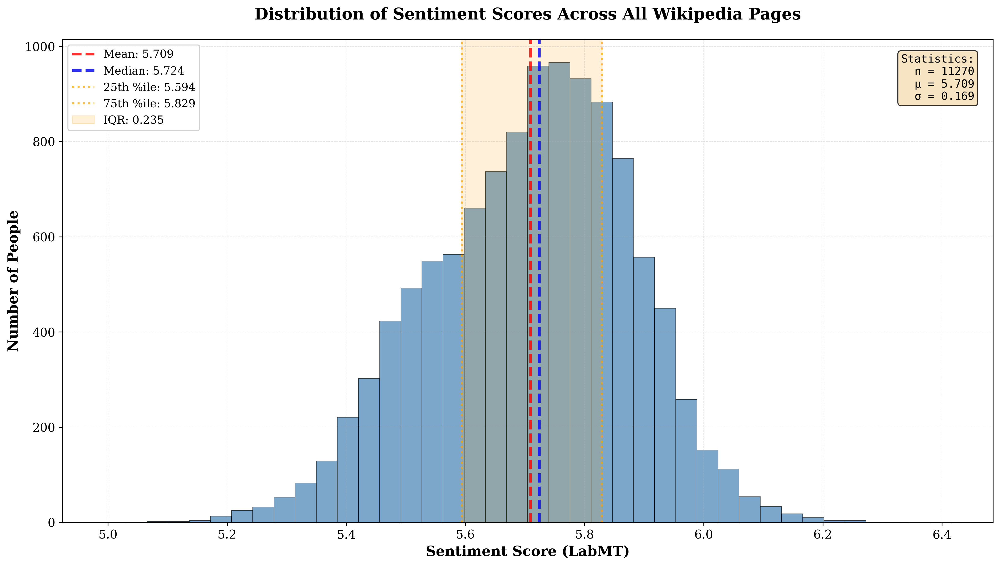

In [22]:
# Plot sentiment distribution histogram
fig, ax = plt.subplots(figsize=(14, 8))

# Create histogram
n, bins, patches = ax.hist(all_sentiments, bins=40, alpha=0.7, color='steelblue',
                           edgecolor='black', linewidth=0.5, density=False)

# Add vertical lines for statistics
ax.axvline(sentiment_mean, color='red', linestyle='--', linewidth=2.5,
           label=f'Mean: {sentiment_mean:.3f}', alpha=0.8)
ax.axvline(sentiment_median, color='blue', linestyle='--', linewidth=2.5,
           label=f'Median: {sentiment_median:.3f}', alpha=0.8)
ax.axvline(sentiment_25th, color='orange', linestyle=':', linewidth=2,
           label=f'25th %ile: {sentiment_25th:.3f}', alpha=0.7)
ax.axvline(sentiment_75th, color='orange', linestyle=':', linewidth=2,
           label=f'75th %ile: {sentiment_75th:.3f}', alpha=0.7)

# Shade the IQR region
ax.axvspan(sentiment_25th, sentiment_75th, alpha=0.15, color='orange',
           label=f'IQR: {sentiment_75th - sentiment_25th:.3f}')

ax.set_xlabel('Sentiment Score (LabMT)', fontsize=14, fontweight='bold')
ax.set_ylabel('Number of People', fontsize=14, fontweight='bold')
ax.set_title('Distribution of Sentiment Scores Across All Wikipedia Pages',
             fontsize=16, fontweight='bold', pad=20)
ax.legend(loc='upper left', fontsize=11, framealpha=0.9)

# Add text box with statistics
textstr = '\n'.join([
    f'Statistics:',
    f'  n = {len(all_sentiments)}',
    f'  μ = {sentiment_mean:.3f}',
    f'  σ = {sentiment_std:.3f}',
])
props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
ax.text(0.98, 0.97, textstr, transform=ax.transAxes, fontsize=11,
        verticalalignment='top', horizontalalignment='right', bbox=props,
        family='monospace')

ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

In [23]:
# Calculate sentiment by occupation
occupation_sentiments = {}

for occ in top_10_occupations:
    sentiments = []
    
    for node in network.nodes():
        if network.nodes[node].get('occupation') == occ:
            sentiment = network.nodes[node].get('sentiment')
            if sentiment is not None:
                sentiments.append(sentiment)
    
    if sentiments:
        occupation_sentiments[occ] = {
            'mean': np.mean(sentiments),
            'std': np.std(sentiments),
            'median': np.median(sentiments),
            'count': len(sentiments),
            'min': np.min(sentiments),
            'max': np.max(sentiments)
        }

# Print summary
print("Sentiment by Occupation (Top 10):\n")
print(f"{'Occupation':<25} {'Mean':>8} {'Std':>8} {'Median':>8} {'Count':>8}")
print("="*65)

# Sort by mean sentiment
sorted_occs = sorted(occupation_sentiments.items(), key=lambda x: x[1]['mean'], reverse=True)
for occ, stats in sorted_occs:
    print(f"{occ:<25} {stats['mean']:>8.4f} {stats['std']:>8.4f} {stats['median']:>8.4f} {stats['count']:>8}")

Sentiment by Occupation (Top 10):

Occupation                    Mean      Std   Median    Count
SINGER                      5.8901   0.1304   5.9033      435
MUSICIAN                    5.8699   0.1239   5.8739      376
COMPOSER                    5.8362   0.0978   5.8259      225
ACTOR                       5.8284   0.1038   5.8362     1189
SOCCER PLAYER               5.8054   0.0922   5.8072     1050
PHYSICIST                   5.7695   0.1267   5.7568      268
WRITER                      5.7448   0.1146   5.7447      949
PHILOSOPHER                 5.6919   0.1013   5.6978      280
RELIGIOUS FIGURE            5.6006   0.1372   5.6002      511
POLITICIAN                  5.5538   0.1244   5.5441     2511


C:\Users\MATRIXCOMPUTER\AppData\Local\Temp\ipykernel_14820\1223763445.py:49: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot(occupation_sentiment_lists, vert=False, labels=occ_labels,


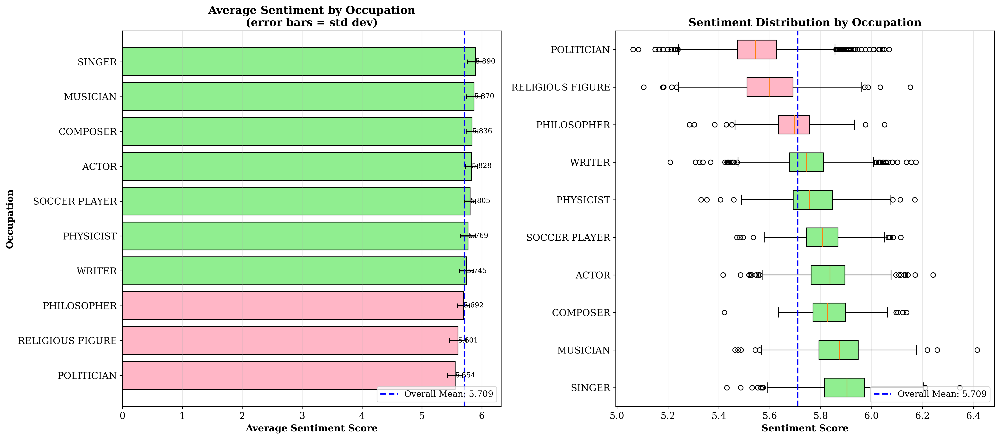

In [24]:
# Visualize sentiment by occupation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Left: Bar chart of average sentiment by occupation
occs = [occ for occ, _ in sorted_occs]
means = [occupation_sentiments[occ]['mean'] for occ in occs]
stds = [occupation_sentiments[occ]['std'] for occ in occs]

# Color bars based on relative sentiment
colors = []
for mean in means:
    if mean > sentiment_mean + 0.01:
        colors.append('#90EE90')  # Green for above average
    elif mean < sentiment_mean - 0.01:
        colors.append('#FFB6C6')  # Red for below average
    else:
        colors.append('#D3D3D3')  # Gray for near average

bars = ax1.barh(occs, means, xerr=stds, color=colors, edgecolor='black', 
                linewidth=1, capsize=3)
ax1.axvline(sentiment_mean, color='blue', linestyle='--', linewidth=2,
            label=f'Overall Mean: {sentiment_mean:.3f}')
ax1.set_xlabel('Average Sentiment Score', fontsize=12, fontweight='bold')
ax1.set_ylabel('Occupation', fontsize=12, fontweight='bold')
ax1.set_title('Average Sentiment by Occupation\n(error bars = std dev)', 
              fontsize=14, fontweight='bold')
ax1.legend(loc='lower right')
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3)

# Add value labels
for bar, mean in zip(bars, means):
    ax1.text(mean + 0.005, bar.get_y() + bar.get_height()/2, 
             f'{mean:.3f}', va='center', fontsize=9)

# Right: Box plot of sentiment distributions by occupation
occupation_sentiment_lists = []
occ_labels = []
for occ in occs:
    sentiments = []
    for node in network.nodes():
        if network.nodes[node].get('occupation') == occ:
            sentiment = network.nodes[node].get('sentiment')
            if sentiment is not None:
                sentiments.append(sentiment)
    occupation_sentiment_lists.append(sentiments)
    occ_labels.append(occ)

bp = ax2.boxplot(occupation_sentiment_lists, vert=False, labels=occ_labels, 
                 patch_artist=True)
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

ax2.axvline(sentiment_mean, color='blue', linestyle='--', linewidth=2,
            label=f'Overall Mean: {sentiment_mean:.3f}')
ax2.set_xlabel('Sentiment Score', fontsize=12, fontweight='bold')
ax2.set_title('Sentiment Distribution by Occupation', fontsize=14, fontweight='bold')
ax2.legend(loc='lower right')
ax2.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

## Betweenness Centrality by Occupation

In [25]:
# Load betweenness centrality from pickle file
import pickle

print("Loading betweenness centrality from cache...")
with open('centrality_cache.pkl', 'rb') as f:
    centrality_data = pickle.load(f)

# Check what's in the pickle file
print(f"\nKeys in centrality cache: {list(centrality_data.keys())}")

# Load betweenness centrality
betweenness = centrality_data.get('betweenness', {})
print(f"✓ Loaded betweenness centrality for {len(betweenness)} nodes")

# Show top 5 people by betweenness centrality
sorted_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)
print("\nTop 5 people by betweenness centrality:")
for node, bc in sorted_betweenness[:5]:
    occ = network.nodes[node].get('occupation', 'Unknown')
    print(f"  {network.nodes[node].get('Name', node):<30} {bc:.6f}  ({occ})")

Loading betweenness centrality from cache...

Keys in centrality cache: ['degree', 'betweenness', 'closeness', 'eigenvector', 'pagerank']
✓ Loaded betweenness centrality for 11286 nodes

Top 5 people by betweenness centrality:
  Barack Obama                   0.042260  (POLITICIAN)
  Adolf Hitler                   0.040600  (POLITICIAN)
  William Shakespeare            0.025570  (WRITER)
  George Bush                    0.023800  (POLITICIAN)
  Pope John Paul II              0.020291  (RELIGIOUS FIGURE)


In [26]:
# Calculate betweenness centrality statistics by occupation
occupation_betweenness = defaultdict(list)

for node, bc in betweenness.items():
    occupation = network.nodes[node].get('occupation', 'Unknown')
    occupation_betweenness[occupation].append(bc)

# Get statistics per occupation
occupation_bc_stats = {}
for occ, bc_values in occupation_betweenness.items():
    if bc_values:
        occupation_bc_stats[occ] = {
            'avg_betweenness': np.mean(bc_values),
            'max_betweenness': max(bc_values),
            'count': len(bc_values),
            'sum_betweenness': sum(bc_values),
            'median_betweenness': np.median(bc_values),
            'std_betweenness': np.std(bc_values)
        }

# Sort by average betweenness centrality (top 5)
sorted_by_avg_bc = sorted(occupation_bc_stats.items(), 
                          key=lambda x: x[1]['avg_betweenness'], reverse=True)[:5]

# Sort by total betweenness centrality (top 5)
sorted_by_sum_bc = sorted(occupation_bc_stats.items(), 
                          key=lambda x: x[1]['sum_betweenness'], reverse=True)[:5]

print("="*90)
print("TOP 5 OCCUPATIONS BY AVERAGE BETWEENNESS CENTRALITY PER PERSON")
print("="*90)
print(f"{'Occupation':<30} {'Avg BC':>12} {'Max BC':>12} {'People':>8} {'Total BC':>12}")
print("-"*90)
for occ, stats in sorted_by_avg_bc:
    print(f"{occ:<30} {stats['avg_betweenness']:>12.6f} {stats['max_betweenness']:>12.6f} "
          f"{stats['count']:>8} {stats['sum_betweenness']:>12.6f}")

print("\n" + "="*90)
print("TOP 5 OCCUPATIONS BY TOTAL BETWEENNESS CENTRALITY (SUM)")
print("="*90)
print(f"{'Occupation':<30} {'Total BC':>12} {'Avg BC':>12} {'People':>8} {'Max BC':>12}")
print("-"*90)
for occ, stats in sorted_by_sum_bc:
    print(f"{occ:<30} {stats['sum_betweenness']:>12.6f} {stats['avg_betweenness']:>12.6f} "
          f"{stats['count']:>8} {stats['max_betweenness']:>12.6f}")

TOP 5 OCCUPATIONS BY AVERAGE BETWEENNESS CENTRALITY PER PERSON
Occupation                           Avg BC       Max BC   People     Total BC
------------------------------------------------------------------------------------------
CRITIC                             0.000938     0.003063        5     0.004689
BOXER                              0.000648     0.006756       14     0.009067
COACH                              0.000565     0.004637       75     0.042382
HISTORIAN                          0.000526     0.004870       49     0.025766
PHILOSOPHER                        0.000431     0.012881      281     0.121104

TOP 5 OCCUPATIONS BY TOTAL BETWEENNESS CENTRALITY (SUM)
Occupation                         Total BC       Avg BC   People       Max BC
------------------------------------------------------------------------------------------
POLITICIAN                         0.743786     0.000296     2517     0.042260
WRITER                             0.267467     0.000281      951 

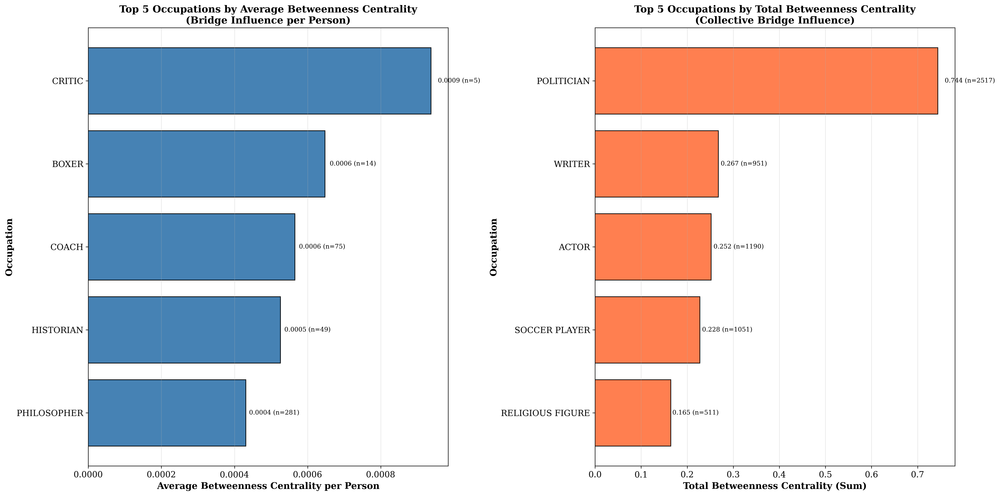


✓ Betweenness centrality visualizations complete!


In [27]:
# Visualize betweenness centrality by occupation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Left: Average betweenness centrality per person
occs_avg = [occ for occ, _ in sorted_by_avg_bc]
avg_bcs = [occupation_bc_stats[occ]['avg_betweenness'] for occ in occs_avg]
counts_avg = [occupation_bc_stats[occ]['count'] for occ in occs_avg]

bars1 = ax1.barh(occs_avg, avg_bcs, color='steelblue', edgecolor='black', linewidth=1)
ax1.set_xlabel('Average Betweenness Centrality per Person', fontsize=13, fontweight='bold')
ax1.set_ylabel('Occupation', fontsize=13, fontweight='bold')
ax1.set_title('Top 5 Occupations by Average Betweenness Centrality\n(Bridge Influence per Person)', 
              fontsize=14, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3)

# Add value labels
for bar, bc, count in zip(bars1, avg_bcs, counts_avg):
    ax1.text(bc + bc*0.02, bar.get_y() + bar.get_height()/2, 
             f'{bc:.4f} (n={count})', va='center', fontsize=9)

# Right: Total betweenness centrality (sum)
occs_sum = [occ for occ, _ in sorted_by_sum_bc]
sum_bcs = [occupation_bc_stats[occ]['sum_betweenness'] for occ in occs_sum]
counts_sum = [occupation_bc_stats[occ]['count'] for occ in occs_sum]

bars2 = ax2.barh(occs_sum, sum_bcs, color='coral', edgecolor='black', linewidth=1)
ax2.set_xlabel('Total Betweenness Centrality (Sum)', fontsize=13, fontweight='bold')
ax2.set_ylabel('Occupation', fontsize=13, fontweight='bold')
ax2.set_title('Top 5 Occupations by Total Betweenness Centrality\n(Collective Bridge Influence)', 
              fontsize=14, fontweight='bold')
ax2.invert_yaxis()
ax2.grid(axis='x', alpha=0.3)

# Add value labels
for bar, bc, count in zip(bars2, sum_bcs, counts_sum):
    ax2.text(bc + bc*0.02, bar.get_y() + bar.get_height()/2, 
             f'{bc:.3f} (n={count})', va='center', fontsize=9)

plt.tight_layout()
plt.show()

print("\n✓ Betweenness centrality visualizations complete!")